# Satellite Data Download and Visualization

This notebook demonstrates how to download and visualize satellite data from Sentinel-1 and Sentinel-2 missions using the `sentinelhub-py` library.

## What you'll learn:
- Setting up credentials for Sentinel Hub
- Downloading Sentinel-2 optical data (RGB, NDVI, different bands)
- Downloading Sentinel-1 SAR data (VV, VH polarizations)
- Creating beautiful visualizations
- Calculating vegetation and water indices
- Comparing different satellite data types

## Prerequisites:
1. **Sentinel Hub Account**: Get free credentials at [apps.sentinel-hub.com](https://apps.sentinel-hub.com/)
2. **Required packages**: Run the setup cell below to install dependencies

---

## Import Libraries

In [30]:
# Import all necessary libraries
import os
import datetime as dt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# Sentinel Hub imports
from sentinelhub import (
    CRS,
    BBox,
    DataCollection,
    MimeType,
    SentinelHubRequest,
    SHConfig,
    bbox_to_dimensions,
)

# For interactive widgets (optional)
try:
    import ipywidgets as widgets
    from IPython.display import display, HTML
    WIDGETS_AVAILABLE = True
except ImportError:
    WIDGETS_AVAILABLE = False
    print("Note: ipywidgets not available. Interactive features will be limited.")

# Set up matplotlib for better plots
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300

print(" All libraries imported successfully!")
print(f" Matplotlib backend: {plt.get_backend()}")

 All libraries imported successfully!
 Matplotlib backend: module://matplotlib_inline.backend_inline


## Setup Credentials

You need Sentinel Hub credentials to download satellite data. Get them for free at [apps.sentinel-hub.com](https://apps.sentinel-hub.com/)

Create a `.env` file in this directory with:
```
SH_CLIENT_ID=your_client_id_here
SH_CLIENT_SECRET=your_client_secret_here
```



In [31]:
# Setup Sentinel Hub credentials
from dotenv import load_dotenv

# Try to load from .env file first
load_dotenv()
config = SHConfig()

config.sh_client_id = os.getenv("SH_CLIENT_ID")
config.sh_client_secret = os.getenv("SH_CLIENT_SECRET")

# Option 2: If not found in .env, enter directly (less secure)
if not config.sh_client_id or not config.sh_client_secret:
    print("  Credentials not found in .env file")
    print("\n Get free credentials at: https://apps.sentinel-hub.com/")

    if not config.sh_client_id or not config.sh_client_secret:
        print(" Please provide your Sentinel Hub credentials")
        print("Either create a .env file or enter them directly in the cell above")
    else:
        print(" Credentials loaded successfully")
else:
    print(" Credentials loaded from .env file")


 Credentials loaded from .env file


## Define Area of Interest

Let's define the geographic area we want to analyze. We'll use several interesting locations that showcase different satellite data applications.

In [32]:
# Define several interesting areas for demonstration
areas_of_interest = {
    "Lake Bled, Slovenia": BBox(bbox=[14.0, 46.0, 14.2, 46.15], crs=CRS.WGS84),
    "Venice, Italy": BBox(bbox=[12.25, 45.40, 12.45, 45.50], crs=CRS.WGS84),
    "Manhattan, NYC": BBox(bbox=[-74.02, 40.75, -73.95, 40.78], crs=CRS.WGS84),
    "Agricultural Area, Iowa": BBox(bbox=[-93.7, 42.0, -93.5, 42.2], crs=CRS.WGS84),
    "Sahara Desert, Algeria": BBox(bbox=[2.0, 23.0, 2.3, 23.3], crs=CRS.WGS84)
}

# Select default area
selected_area = "Lake Bled, Slovenia"
bbox = areas_of_interest[selected_area]

# Time interval for data
time_interval = ('2023-07-01', '2023-07-31')

print(f" Selected Area: {selected_area}")
print(f" Bounding Box: {bbox}")
print(f" Time Period: {time_interval[0]} to {time_interval[1]}")


 Selected Area: Lake Bled, Slovenia
 Bounding Box: 14.0,46.0,14.2,46.15
 Time Period: 2023-07-01 to 2023-07-31


## Visualization Helper Functions

Let's create some helper functions to make beautiful visualizations of our satellite data.

In [33]:
def plot_rgb_image(image, title="Satellite Image", factor=3.5/255, clip_range=(0, 1)):
    """
    Plot RGB image with proper scaling
    """
    fig, ax = plt.subplots(figsize=(12, 12))
    
    # Scale and clip image
    scaled_image = np.clip(image * factor, *clip_range)
    
    # Display image
    ax.imshow(scaled_image)
    ax.set_title(title, fontsize=16, fontweight='bold')
    ax.axis('off')
    
    # Add area and time info
    info_text = f"Area: {selected_area}\nTime: {time_interval[0]} to {time_interval[1]}"
    ax.text(0.02, 0.98, info_text, transform=ax.transAxes, 
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    return fig

def plot_index_with_colorbar(data, title, cmap='RdYlGn', vmin=None, vmax=None, unit=""):
    """
    Plot index data with colorbar
    """
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Handle vmin/vmax
    if vmin is None:
        vmin = np.percentile(data, 2)
    if vmax is None:
        vmax = np.percentile(data, 98)
    
    # Plot with colorbar
    im = ax.imshow(data.squeeze(), cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize=16, fontweight='bold')
    ax.axis('off')
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(f'{title} {unit}', fontsize=12)
    
    # Add info
    stats_text = f"Min: {np.nanmin(data):.3f}\nMax: {np.nanmax(data):.3f}\nMean: {np.nanmean(data):.3f}"
    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    return fig

def plot_comparison_grid(images, titles, suptitle="Comparison", cmap='gray'):
    """
    Plot multiple images in a grid for comparison
    """
    n_images = len(images)
    
    if n_images <= 2:
        rows, cols = 1, n_images
        figsize = (15, 7)
    elif n_images <= 4:
        rows, cols = 2, 2
        figsize = (15, 15)
    else:
        rows, cols = 2, 3
        figsize = (18, 12)
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if n_images == 1:
        axes = [axes]
    elif rows == 1:
        axes = axes
    else:
        axes = axes.flatten()
    
    for i, (image, title) in enumerate(zip(images, titles)):
        if i < len(axes):
            if len(image.shape) == 3 and image.shape[2] == 3:
                # RGB image
                axes[i].imshow(image)
            else:
                # Single band
                im = axes[i].imshow(image.squeeze(), cmap=cmap)
                plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)
            
            axes[i].set_title(title, fontsize=12, fontweight='bold')
            axes[i].axis('off')
    
    # Hide unused subplots
    for i in range(n_images, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(suptitle, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

print(" Visualization functions ready!")

 Visualization functions ready!


##  Sentinel-2 Optical Data Download

Sentinel-2 provides high-resolution optical imagery with 13 spectral bands. Let's start with basic RGB and then explore different band combinations.

###  True Color RGB Image

 Downloaded RGB image: (512, 512, 3)
 Downloaded RGB image: (512, 512, 3)


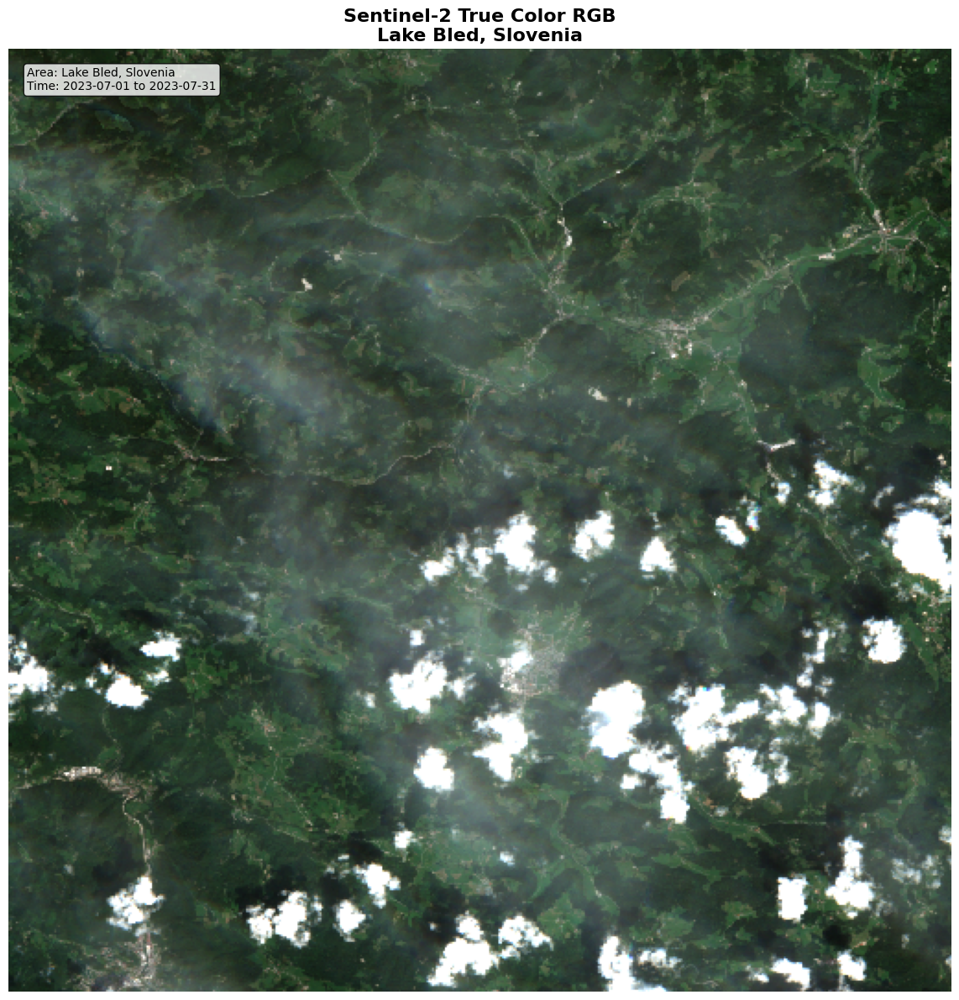

In [34]:
# Download Sentinel-2 True Color RGB
print(" Downloading Sentinel-2 True Color RGB...")

evalscript_true_color = """
//VERSION=3
function setup() {
    return {
        input: [{
            bands: ["B02", "B03", "B04"]
        }],
        output: {
            bands: 3
        }
    };
}

function evaluatePixel(sample) {
    return [sample.B04, sample.B03, sample.B02];
}
"""

request_rgb = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=time_interval,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=bbox,
    size=(512, 512),
    config=config,
)

try:
    rgb_image = request_rgb.get_data()[0]
    print(f" Downloaded RGB image: {rgb_image.shape}")
    
    # Plot the image
    plot_rgb_image(rgb_image, 
                  title=f"Sentinel-2 True Color RGB\n{selected_area}",
                  factor=3.5/255)
    
except Exception as e:
    print(f" Error downloading RGB data: {e}")
    print("This might be due to cloud cover or data availability. Try a different time period.")
    rgb_image = None

###  False Color and NDVI

 Downloaded false color and NDVI: (512, 512, 4)
 Downloaded false color and NDVI: (512, 512, 4)


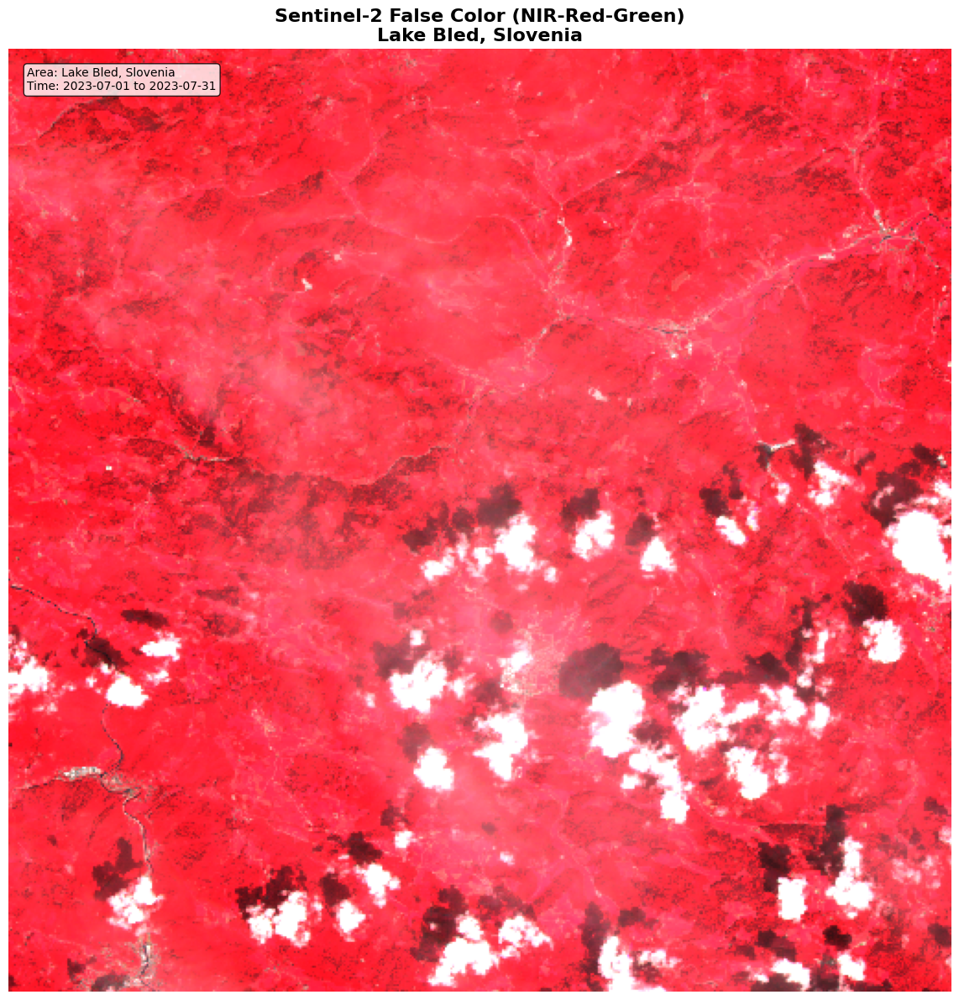

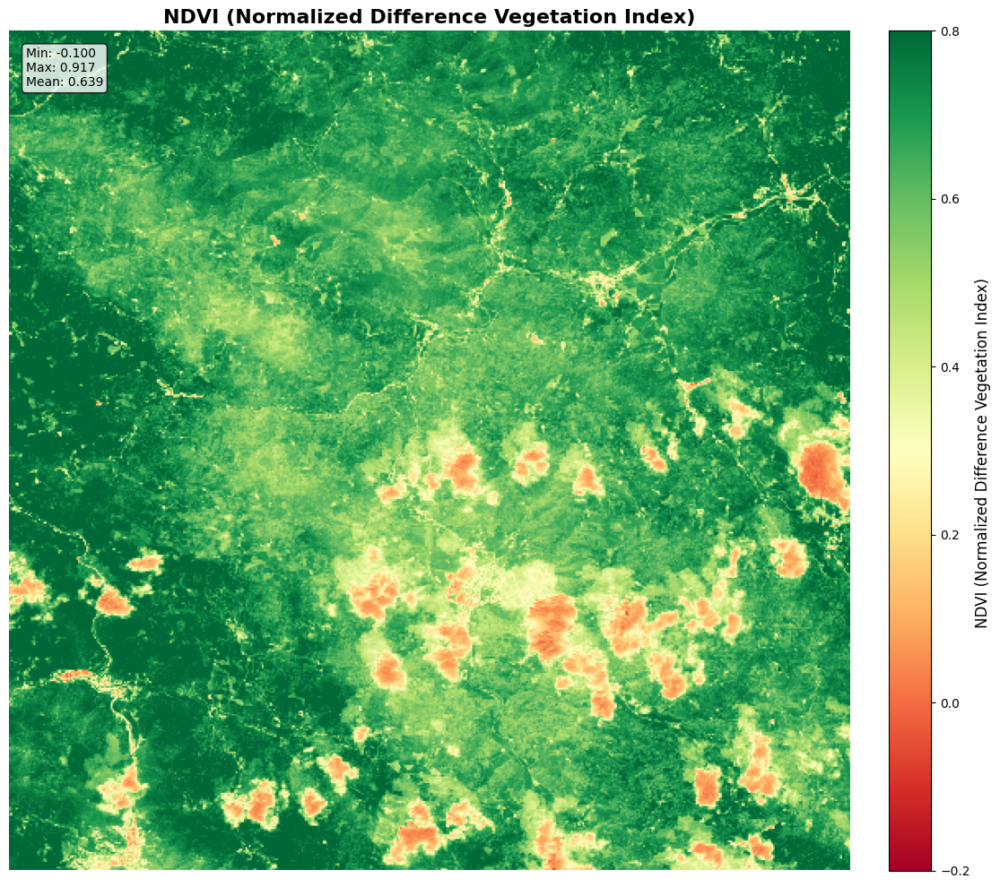

In [35]:
# Download False Color and calculate NDVI
print(" Downloading False Color and calculating NDVI...")

evalscript_false_color_ndvi = """
//VERSION=3
function setup() {
    return {
        input: [{
            bands: ["B03", "B04", "B08"]
        }],
        output: {
            bands: 4,
            sampleType: "FLOAT32"
        }
    };
}

function evaluatePixel(sample) {
    // False color: NIR, Red, Green
    var false_r = sample.B08;
    var false_g = sample.B04;
    var false_b = sample.B03;
    
    // NDVI calculation
    var ndvi = (sample.B08 - sample.B04) / (sample.B08 + sample.B04);
    
    return [false_r, false_g, false_b, ndvi];
}
"""

request_false_ndvi = SentinelHubRequest(
    evalscript=evalscript_false_color_ndvi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=time_interval,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    bbox=bbox,
    size=(512, 512),
    config=config,
)

try:
    false_ndvi_data = request_false_ndvi.get_data()[0]
    
    # Extract false color and NDVI
    false_color = false_ndvi_data[:, :, :3]
    ndvi = false_ndvi_data[:, :, 3]
    
    print(f" Downloaded false color and NDVI: {false_ndvi_data.shape}")
    
    # Plot false color
    false_color_normalized = np.clip(false_color * 3.5, 0, 1)
    plot_rgb_image(false_color_normalized, 
                  title=f"Sentinel-2 False Color (NIR-Red-Green)\n{selected_area}",
                  factor=1)  # Already normalized
    
    # Plot NDVI
    plot_index_with_colorbar(ndvi, 
                            title="NDVI (Normalized Difference Vegetation Index)",
                            cmap='RdYlGn', vmin=-0.2, vmax=0.8)
    
except Exception as e:
    print(f" Error downloading false color/NDVI: {e}")
    false_color = None
    ndvi = None

###  Water Detection with NDWI

 Calculating water detection indices...
 Calculated water indices: (512, 512, 2)
 Calculated water indices: (512, 512, 2)


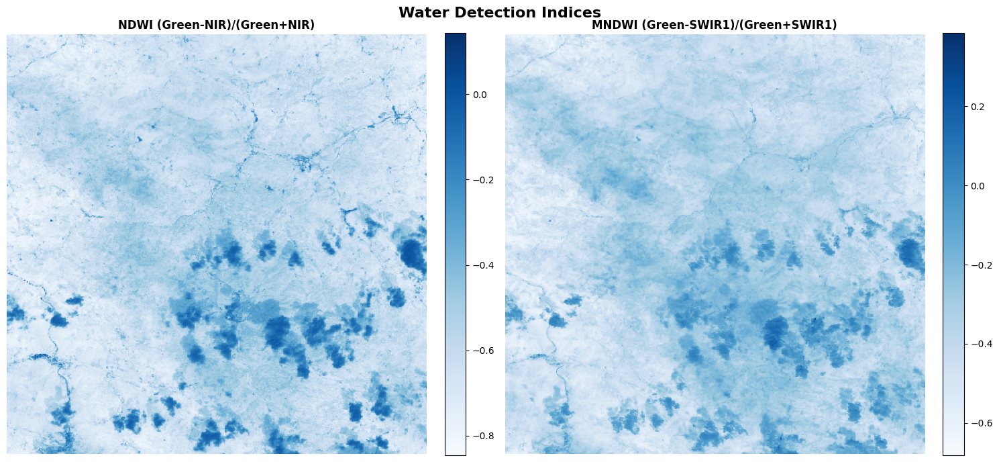

In [23]:
# Calculate water indices
print(" Calculating water detection indices...")

evalscript_water = """
//VERSION=3
function setup() {
    return {
        input: [{
            bands: ["B03", "B08", "B11"]
        }],
        output: {
            bands: 2,
            sampleType: "FLOAT32"
        }
    };
}

function evaluatePixel(sample) {
    var green = sample.B03;
    var nir = sample.B08;
    var swir1 = sample.B11;
    
    // NDWI (Normalized Difference Water Index)
    var ndwi = (green - nir) / (green + nir);
    
    // MNDWI (Modified Normalized Difference Water Index)
    var mndwi = (green - swir1) / (green + swir1);
    
    return [ndwi, mndwi];
}
"""

request_water = SentinelHubRequest(
    evalscript=evalscript_water,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=time_interval,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    bbox=bbox,
    size=(512, 512),
    config=config,
)

try:
    water_data = request_water.get_data()[0]
    
    ndwi = water_data[:, :, 0]
    mndwi = water_data[:, :, 1]
    
    print(f" Calculated water indices: {water_data.shape}")
    
    # Plot water indices
    plot_comparison_grid(
        [ndwi, mndwi],
        ["NDWI (Green-NIR)/(Green+NIR)", "MNDWI (Green-SWIR1)/(Green+SWIR1)"],
        suptitle="Water Detection Indices",
        cmap='Blues'
    )
    
except Exception as e:
    print(f" Error calculating water indices: {e}")
    ndwi = None
    mndwi = None

##  Sentinel-1 SAR Data Download

Sentinel-1 provides Synthetic Aperture Radar (SAR) data that works in all weather conditions, day and night. SAR data is excellent for detecting water, monitoring changes, and analyzing surface properties.

 Downloaded SAR data: (512, 512, 2)
 Downloaded SAR data: (512, 512, 2)


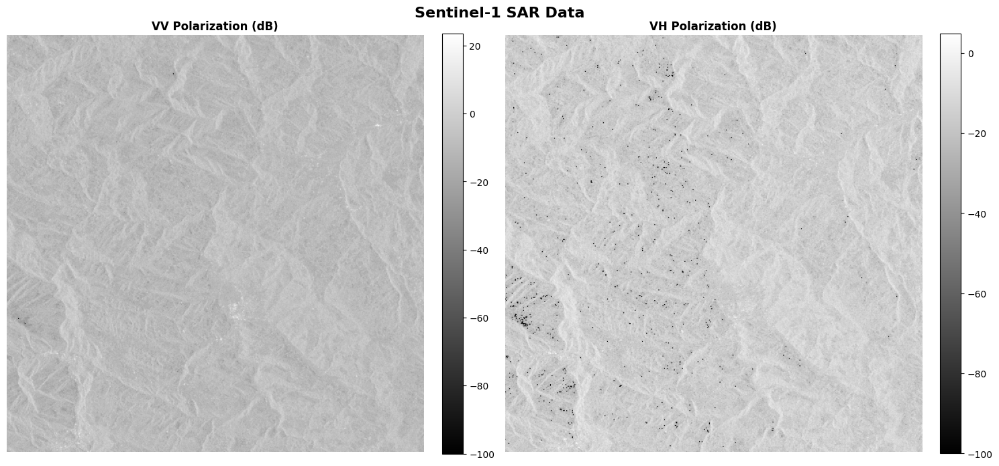

 Creating SAR RGB composite...


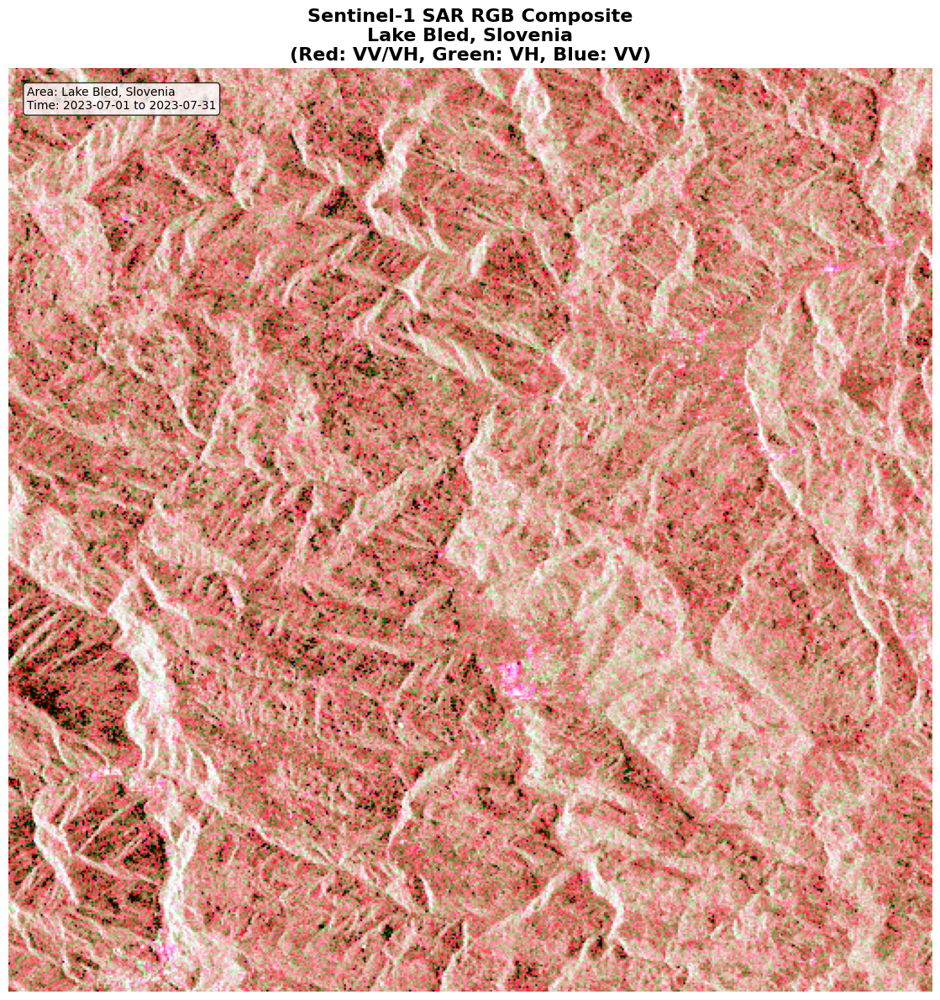

In [24]:
# Download Sentinel-1 SAR data
print(" Downloading Sentinel-1 SAR data...")

evalscript_sar = """
//VERSION=3
function setup() {
    return {
        input: [{
            bands: ["VV", "VH"]
        }],
        output: {
            bands: 2,
            sampleType: "FLOAT32"
        }
    };
}

function evaluatePixel(sample) {
    return [sample.VV, sample.VH];
}
"""

request_sar = SentinelHubRequest(
    evalscript=evalscript_sar,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL1_IW,
            time_interval=time_interval,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    bbox=bbox,
    size=(512, 512),
    config=config,
)

try:
    sar_data = request_sar.get_data()[0]
    
    vv_data = sar_data[:, :, 0]
    vh_data = sar_data[:, :, 1]
    
    print(f" Downloaded SAR data: {sar_data.shape}")
    
    # Convert to decibel scale for better visualization
    vv_db = 10 * np.log10(np.maximum(vv_data, 1e-10))
    vh_db = 10 * np.log10(np.maximum(vh_data, 1e-10))
    
    # Plot SAR data
    plot_comparison_grid(
        [vv_db, vh_db],
        ["VV Polarization (dB)", "VH Polarization (dB)"],
        suptitle="Sentinel-1 SAR Data",
        cmap='gray'
    )
    
    # Create SAR RGB composite
    print(" Creating SAR RGB composite...")
    
    # Normalize for RGB display
    vv_norm = (vv_db - np.percentile(vv_db, 1)) / (np.percentile(vv_db, 99) - np.percentile(vv_db, 1))
    vh_norm = (vh_db - np.percentile(vh_db, 1)) / (np.percentile(vh_db, 99) - np.percentile(vh_db, 1))
    ratio_norm = vv_norm / (vh_norm + 0.001)
    
    # Create RGB composite
    sar_rgb = np.dstack([
        np.clip(ratio_norm, 0, 1),  # Red: VV/VH ratio
        np.clip(vh_norm, 0, 1),     # Green: VH
        np.clip(vv_norm, 0, 1)      # Blue: VV
    ])
    
    plot_rgb_image(sar_rgb, 
                  title=f"Sentinel-1 SAR RGB Composite\n{selected_area}\n(Red: VV/VH, Green: VH, Blue: VV)",
                  factor=1)
    
except Exception as e:
    print(f" Error downloading SAR data: {e}")
    print("SAR data might not be available for this area/time. This is normal in some regions.")
    vv_data = None
    vh_data = None

##  Multi-Sensor Comparison

Let's compare different satellite data types side by side to understand their strengths and applications.

 Creating multi-sensor comparison...


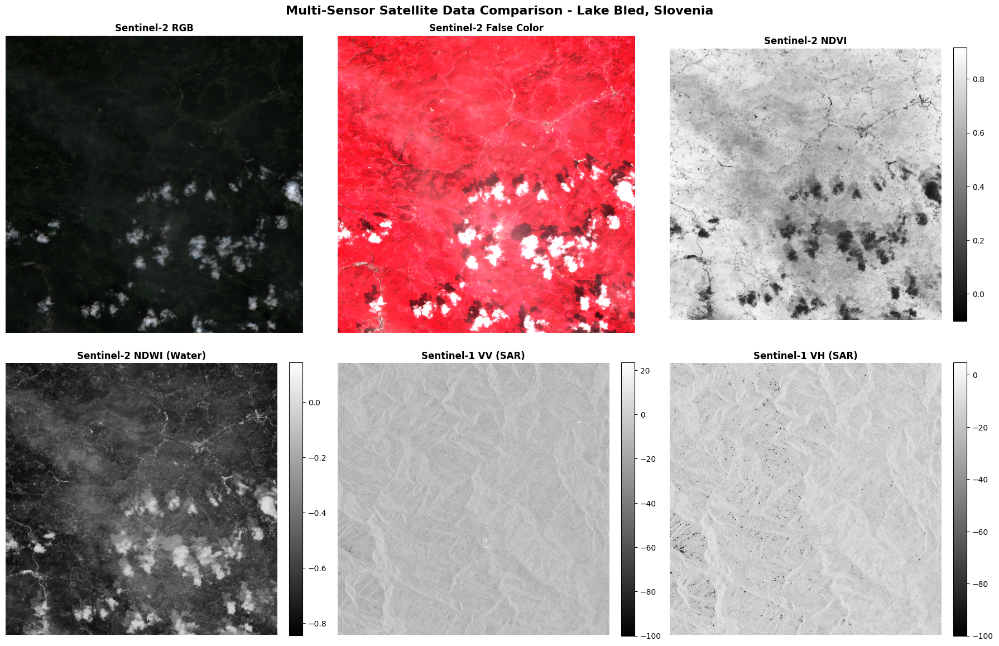


 DATA INTERPRETATION GUIDE:

 OPTICAL DATA (Sentinel-2):
• RGB: Natural colors as seen by human eye
• False Color: Vegetation appears red (NIR response)
• NDVI: Green = healthy vegetation, red = bare soil/water
• NDWI: Blue = water bodies, red = land

 SAR DATA (Sentinel-1):
• VV: Sensitive to volume scattering (buildings, trees)
• VH: Sensitive to surface scattering (water, smooth surfaces)
• Dark areas = smooth surfaces (water, ice)
• Bright areas = rough surfaces (urban, vegetation)

 APPLICATIONS:
• Agriculture: Use NDVI for crop health monitoring
• Water Resources: Use NDWI and SAR for water detection
• Urban Planning: Use SAR VV for building detection
• Disaster Management: Use SAR for all-weather monitoring


In [26]:
# Create comprehensive comparison
print(" Creating multi-sensor comparison...")

# Collect all available data
comparison_images = []
comparison_titles = []

if rgb_image is not None:
    comparison_images.append(rgb_image)
    comparison_titles.append("Sentinel-2 RGB")

if false_color is not None:
    comparison_images.append(false_color_normalized)
    comparison_titles.append("Sentinel-2 False Color")

if ndvi is not None:
    comparison_images.append(ndvi)
    comparison_titles.append("Sentinel-2 NDVI")

if ndwi is not None:
    comparison_images.append(ndwi)
    comparison_titles.append("Sentinel-2 NDWI (Water)")

if vv_data is not None:
    comparison_images.append(vv_db)
    comparison_titles.append("Sentinel-1 VV (SAR)")

if vh_data is not None:
    comparison_images.append(vh_db)
    comparison_titles.append("Sentinel-1 VH (SAR)")

if len(comparison_images) > 0:
    plot_comparison_grid(
        comparison_images,
        comparison_titles,
        suptitle=f"Multi-Sensor Satellite Data Comparison - {selected_area}"
    )
else:
    print(" No data available for comparison")

# Print data interpretation guide
print("\n DATA INTERPRETATION GUIDE:")
print("\n OPTICAL DATA (Sentinel-2):")
print("• RGB: Natural colors as seen by human eye")
print("• False Color: Vegetation appears red (NIR response)")
print("• NDVI: Green = healthy vegetation, red = bare soil/water")
print("• NDWI: Blue = water bodies, red = land")

print("\n SAR DATA (Sentinel-1):")
print("• VV: Sensitive to volume scattering (buildings, trees)")
print("• VH: Sensitive to surface scattering (water, smooth surfaces)")
print("• Dark areas = smooth surfaces (water, ice)")
print("• Bright areas = rough surfaces (urban, vegetation)")

print("\n APPLICATIONS:")
print("• Agriculture: Use NDVI for crop health monitoring")
print("• Water Resources: Use NDWI and SAR for water detection")
print("• Urban Planning: Use SAR VV for building detection")
print("• Disaster Management: Use SAR for all-weather monitoring")

##  Statistical Analysis

Let's calculate some basic statistics from our satellite data to understand the area better.

 Calculating satellite data statistics...

📋 SATELLITE DATA STATISTICS:
      Index    Mean  Median    Std       Min     Max    Interpretation
       NDVI  0.6393  0.6711 0.1593   -0.1004  0.9167 Vegetation health
       NDWI -0.5638 -0.5899 0.1420   -0.8461  0.1444     Water content
SAR VV (dB) -9.4226 -9.4862 3.8389 -100.0000 23.4879 Surface roughness


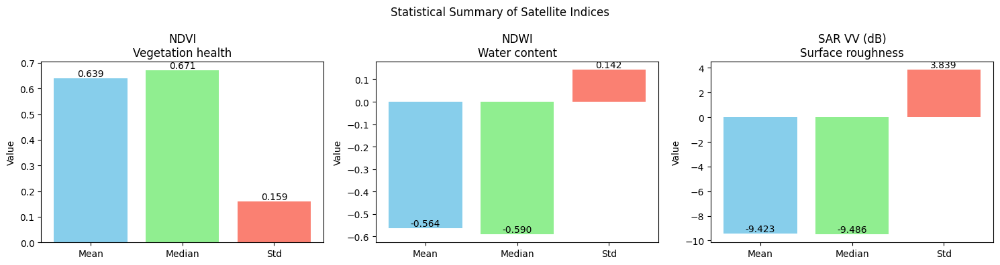


🔍 INTERPRETATION:
• NDVI: Dense vegetation (mean = 0.639)
• NDWI: Land-dominated area (mean = -0.564)
• SAR VV (dB): Rough surfaces (urban/vegetation) (mean = -9.4 dB)


In [27]:
# Calculate and display statistics
print(" Calculating satellite data statistics...")

stats_data = []

# NDVI statistics
if ndvi is not None:
    valid_ndvi = ndvi[(ndvi >= -1) & (ndvi <= 1)]
    stats_data.append({
        'Index': 'NDVI',
        'Mean': np.mean(valid_ndvi),
        'Median': np.median(valid_ndvi),
        'Std': np.std(valid_ndvi),
        'Min': np.min(valid_ndvi),
        'Max': np.max(valid_ndvi),
        'Interpretation': 'Vegetation health'
    })

# NDWI statistics
if ndwi is not None:
    valid_ndwi = ndwi[(ndwi >= -1) & (ndwi <= 1)]
    stats_data.append({
        'Index': 'NDWI',
        'Mean': np.mean(valid_ndwi),
        'Median': np.median(valid_ndwi),
        'Std': np.std(valid_ndwi),
        'Min': np.min(valid_ndwi),
        'Max': np.max(valid_ndwi),
        'Interpretation': 'Water content'
    })

# SAR statistics
if vv_data is not None:
    valid_vv = vv_db[np.isfinite(vv_db)]
    stats_data.append({
        'Index': 'SAR VV (dB)',
        'Mean': np.mean(valid_vv),
        'Median': np.median(valid_vv),
        'Std': np.std(valid_vv),
        'Min': np.min(valid_vv),
        'Max': np.max(valid_vv),
        'Interpretation': 'Surface roughness'
    })

if len(stats_data) > 0:
    # Create DataFrame
    df_stats = pd.DataFrame(stats_data)
    
    # Display table
    print("\n📋 SATELLITE DATA STATISTICS:")
    print("=" * 80)
    print(df_stats.round(4).to_string(index=False))
    
    # Create visualization of statistics
    if len(stats_data) >= 2:
        fig, axes = plt.subplots(1, len(stats_data), figsize=(15, 4))
        if len(stats_data) == 1:
            axes = [axes]
        
        for i, (ax, row) in enumerate(zip(axes, stats_data)):
            # Create simple bar chart of statistics
            stats_values = [row['Mean'], row['Median'], row['Std']]
            stats_labels = ['Mean', 'Median', 'Std']
            
            bars = ax.bar(stats_labels, stats_values, 
                         color=['skyblue', 'lightgreen', 'salmon'])
            ax.set_title(f"{row['Index']}\n{row['Interpretation']}")
            ax.set_ylabel('Value')
            
            # Add value labels on bars
            for bar, value in zip(bars, stats_values):
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{value:.3f}', ha='center', va='bottom')
        
        plt.suptitle('Statistical Summary of Satellite Indices')
        plt.tight_layout()
        plt.show()
        
    # Interpretation
    print("\n🔍 INTERPRETATION:")
    for stat in stats_data:
        index_name = stat['Index']
        mean_val = stat['Mean']
        
        if 'NDVI' in index_name:
            if mean_val > 0.3:
                vegetation_status = "Dense vegetation"
            elif mean_val > 0.1:
                vegetation_status = "Moderate vegetation"
            else:
                vegetation_status = "Sparse/no vegetation"
            print(f"• {index_name}: {vegetation_status} (mean = {mean_val:.3f})")
            
        elif 'NDWI' in index_name:
            if mean_val > 0:
                water_status = "Water-rich area"
            else:
                water_status = "Land-dominated area"
            print(f"• {index_name}: {water_status} (mean = {mean_val:.3f})")
            
        elif 'SAR' in index_name:
            if mean_val > -10:
                surface_status = "Rough surfaces (urban/vegetation)"
            else:
                surface_status = "Smooth surfaces (water/bare soil)"
            print(f"• {index_name}: {surface_status} (mean = {mean_val:.1f} dB)")
            
else:
    print(" No data available for statistical analysis")

##  Interactive Exploration (Optional)

you can interactively explore different areas and time periods at https://browser.dataspace.copernicus.eu/ 